# Dynamic SSD with Focal Loss
Here I'll be trying out the RetinaNet implementation written by rohitgeo

# Imports  

In [1]:
from apex import amp
amp_handle = amp.init(enabled=True)
%matplotlib inline
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from ssdoil import *
import ssdoil
from ssd import *
from utils import *

In [2]:
import importlib

In [3]:
import pandas as pd
from pathlib import Path

from fastai.vision.transform import get_transforms
from fastai.vision.data import ObjectItemList, imagenet_stats#, bb_pad_collate
from fastai import *
from fastai.vision import *

In [4]:
torch.cuda.current_device()

0

In [5]:
torch.cuda.device_count()

2

In [6]:
PATH = Path(r'./Bosch_trafficlight_data/')
JPEGS = 'train/CombinedAnnotatedJPEG'
TEST_IMAGES_PATH = Path('../data/v_data/udacity_testarea_rgb/JPEGImages')
IMG_PATH = PATH/JPEGS


In [7]:
def remove_string_from_name(images, string_to_remove='/home/m090009/dev/CarND-TrafficSignal/Bosch_trafficlight_data/train/JPEGImages/'):
    for i in range(len(images)):
        images[i] = images[i].split('/')[-1]
        if '.png' in images[i]:
            images[i] = images[i].replace('.png', '.jpg') 

In [8]:
from sklearn.model_selection import train_test_split
images, lbl_bbox  = get_annotationss(PATH/'annotated_train.json')
test_images, test_bboxes = get_annotationss(Path('./udacity_test.json'))
# Path('../data/v_data/udacity_testarea_rgb/')
remove_string_from_name(images)
remove_string_from_name(test_images)

train_images, val_images, train_lbl_bbox, val_lbl_bbox = train_test_split(images, lbl_bbox, test_size=0.20, random_state=42)

img2bbox = dict(zip(train_images, train_lbl_bbox))
img2bbox_v = dict(zip(val_images, val_lbl_bbox))
img2bbox_test = dict(zip(test_images, test_bboxes))
def get_y_func(x):
    if x.name in img2bbox:
        bboxes, classes = img2bbox[x.name]
#     elif x.name in img2bbox_test:
#         bboxes, classes = img2bbox_test[x.name]
#     else:
#         bboxes, classes = img2bbox_v[x.name]
    else:
        bboxes, classes = img2bbox_test[x.name]
    return [bboxes, classes]

ValueError: too many values to unpack (expected 2)

In [8]:
def bb_pad_collate(samples:BatchSamples, pad_idx:int=0) -> Tuple[FloatTensor, Tuple[LongTensor, LongTensor]]:
    "Function that collect `samples` of labelled bboxes and adds padding with `pad_idx`."
    if isinstance(samples[0][1], int): return data_collate(samples)
    max_len = max([len(s[1].data[1]) for s in samples])
    bboxes = torch.zeros(len(samples), max_len, 4)
    labels = torch.zeros(len(samples), max_len).long() + pad_idx
    imgs = []
    for i,s in enumerate(samples):
        imgs.append(s[0].data[None])
        bbs, lbls = s[1].data
        if not (bbs.nelement() == 0):
            bboxes[i,-len(lbls):] = bbs
            labels[i,-len(lbls):] = tensor(lbls)
    return torch.cat(imgs,0), (bboxes,labels)

In [9]:
print("Total: {}, Train: {}, Val: {}".format(len(images), len(train_images), len(val_images)))


NameError: name 'images' is not defined

In [10]:
BS = 490

In [11]:
from ssdoil import SSDObjectItemList
%time
JPEGS = 'train/AnnotatedJPEG'
TESTPATH = Path('../data/v_data/udacity_testarea_rgb/')
data = (SSDObjectItemList.from_folder(PATH/JPEGS)
        .split_by_files(test_images)
        .label_from_func(get_y_func)
        .add_test_folder(TEST_IMAGES_PATH)
        .transform(get_transforms(), tfm_y=True, size=224)
        .databunch(bs=BS, collate_fn=bb_pad_collate)
        .normalize(imagenet_stats))

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 6.68 µs


NameError: name 'test_images' is not defined

In [45]:
%%time
data.show_batch()

KeyboardInterrupt: 

# Training

In [47]:
max_lr = 1e-3
lrs = np.array([max_lr/100, max_lr/10, max_lr])

In [48]:
ssd_model = SingleShotDetector(data, focal_loss=True, pretrained_path='ssd-tl-FL-715')

/home/m090009/anaconda3/envs/fastai/lib/python3.7/site-packages/fastai/vision/learner.py:93: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


In [44]:
# ssd_model.learn.show_results(type=DatasetType.Test, ssd=ssd_model)
# ssd_model.learn.get_preds()

Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere


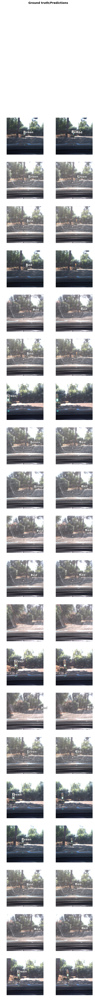

In [49]:
ssd_model.show_results(rows=20, thresh=0.28)

## Export

In [13]:
# ssd_model.learn.export()

In [14]:
# learn = load_learner(PATH/'train/AnnotatedJPEG/')

## Predict

In [15]:
# from torchvision.models import resnet34
# from fastai.transforms import *

In [16]:
# learn = ssd_model.learn

In [17]:
# trn_tfms, val_tfms = tfms_from_model(resnet34,224) # get transformations
# im = val_tfms(Image.open(PATH/'train/TESTJPEGS/test1.jpg'))
# learn.precompute=False # We'll pass in a raw image, not activations
# preds = learn.predict_array(im[None])
# np.argmax(preds) # preds are log probabilities of classes

# res = learn.pred_batch(batch=(xb,yb))

In [18]:
# %debug
EPOCHS = 20

In [20]:
ssd_model.fit(EPOCHS, lr=lrs)

epoch,train_loss,valid_loss,time
0,42.172955,42.820419,01:12
1,42.152046,43.211193,01:10
2,42.173546,42.727951,01:10
3,42.131126,42.858490,01:09
4,41.999001,42.962910,01:10
5,41.996239,42.922867,01:10
6,41.931171,42.811863,01:10
7,41.861671,42.880653,01:10
8,41.852123,42.835979,01:10
9,41.783104,42.848614,01:10


/home/m090009/anaconda3/envs/fastai/lib/python3.7/site-packages/torch/nn/_reduction.py:49: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
Gradient overflow, skipping update


## Save the Model

In [21]:
ssd_model.save('ssd-tl-FL-615')

## Stage 2

In [22]:
ssd_model.learn.freeze_to(-1)
lrs = np.array([max_lr/100, max_lr/10, max_lr])
ssd_model.fit(EPOCHS, lrs/2)

epoch,train_loss,valid_loss,time
0,41.748199,42.916515,01:10
1,41.597187,42.984978,01:10
2,41.642860,43.024971,01:10
3,41.475704,42.764957,01:10
4,41.336567,42.693108,01:10
5,41.333122,42.622562,01:10
6,41.298088,42.670525,01:10
7,41.332909,42.591431,01:10
8,41.324886,42.702248,01:09
9,41.327766,42.802601,01:10


Gradient overflow, skipping update


## Stage 3

In [23]:
ssd_model.learn.freeze_to(-2)
ssd_model.learn.fit(EPOCHS, lrs/2)

epoch,train_loss,valid_loss,time
0,42.752922,43.905228,01:11
1,42.004150,43.469444,01:10
2,41.736572,43.633633,01:10
3,41.665600,42.991756,01:10
4,41.607277,43.189476,01:10
5,41.626125,43.062454,01:10
6,41.610737,44.006081,01:10
7,41.610355,43.301388,01:10
8,41.628979,43.540184,01:10
9,41.659893,43.273266,01:10


Gradient overflow, skipping update


## Stage 4

In [24]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(EPOCHS, lrs/4)

epoch,train_loss,valid_loss,time
0,41.139236,42.933033,01:12
1,41.161755,42.720203,01:11
2,41.029770,42.530773,01:11
3,41.196693,42.440742,01:12
4,41.171165,42.478703,01:11
5,41.116386,42.576771,01:12
6,41.062061,42.474895,01:12
7,41.054211,42.617100,01:12
8,41.040356,42.414345,01:11
9,41.030903,42.436588,01:12


## Stage 5

In [25]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(EPOCHS, lrs/5)

epoch,train_loss,valid_loss,time
0,40.066540,42.565598,01:12
1,40.161221,42.532192,01:12
2,40.411461,42.543198,01:12
3,40.360844,42.337341,01:12
4,40.377182,42.491093,01:12
5,40.409500,42.453514,01:12
6,40.354195,42.817081,01:12
7,40.349247,42.514763,01:12
8,40.366039,42.365444,01:12
9,40.383667,42.503838,01:13


## Stage 6

In [26]:
ssd_model.learn.freeze_to(0)
ssd_model.learn.fit(EPOCHS, lrs/5)

epoch,train_loss,valid_loss,time
0,40.025654,42.409332,01:12
1,40.384205,42.506161,01:12
2,40.398869,42.555153,01:12
3,40.414467,42.471550,01:12
4,40.321060,42.341984,01:12
5,40.267544,42.297668,01:12
6,40.249931,42.406666,01:11
7,40.154610,42.473698,01:12
8,40.205452,42.416988,01:12
9,40.086639,42.379738,01:11


Gradient overflow, skipping update


In [27]:
ssd_model.save('ssd-tl-FL-715')

Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere
Heeeey, Im heeerere


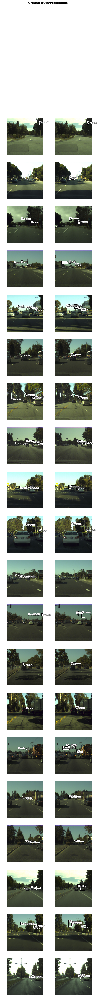

In [17]:
ssd_model.show_results(rows=20, thresh=0.28)

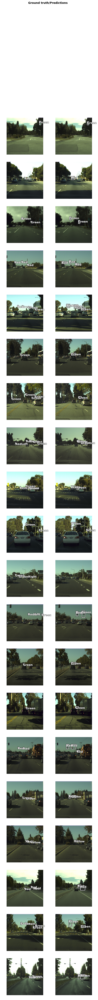

In [29]:
ssd_model.show_results(rows=20, thresh=0.3)

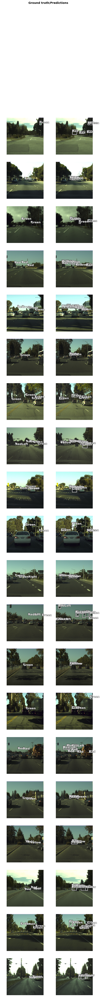

In [30]:
ssd_model.show_results(rows=20, thresh=0.1)

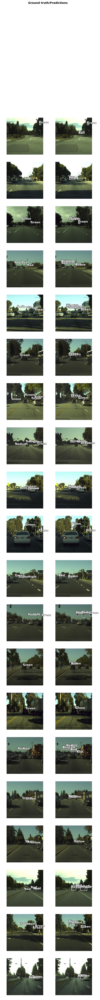

In [31]:
ssd_model.show_results(rows=20, thresh=0.2)

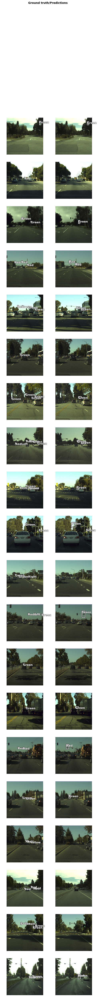

In [32]:
ssd_model.show_results(rows=20, thresh=0.4)

# Test on Udacity data

In [28]:
import os
from os.path import isfile
TESTPATH = Path('../data/v_data/udacity_testarea_rgb/JPEGImages')


## Get Test Images

In [18]:
def get_images(images_path):
    images = []
    for img in os.listdir(str(images_path)):
        if isfile(images_path/img):
            images.append(open_image(images_path/img))
    return images

test_images = get_images(TESTPATH)

## Predict

In [20]:
test_prediction = ssd_model.learn.predict((test_images[0], None))

AttributeError: 'tuple' object has no attribute 'apply_tfms'

In [21]:
%debug

> /home/m090009/anaconda3/envs/fastai/lib/python3.7/site-packages/fastai/vision/data.py(359)reconstruct()
    357 
    358     def reconstruct(self, t, x):
--> 359         (bboxes, labels) = t
    360         if len((labels - self.pad_idx).nonzero()) == 0: return
    361         i = (labels - self.pad_idx).nonzero().min()

ipdb> p t
tensor([[[  0.0107,  -5.9766,  -6.5078,  ...,  -7.6797,  -6.2734,  -5.4922],
         [ -0.0892,  -6.5859,  -6.9453,  ...,  -7.8711,  -6.4180,  -5.4648],
         [ -0.0818,  -6.1641,  -6.6523,  ...,  -7.7109,  -6.0273,  -5.3867],
         ...,
         [ -0.1519, -10.3125, -10.2266,  ..., -10.2734, -10.0781, -10.2266],
         [  0.0258, -10.1328, -10.3125,  ..., -10.2734, -10.1953, -10.3125],
         [  0.2554, -10.2031, -10.3516,  ..., -10.1797, -10.0859, -10.2969]]])
ipdb> q


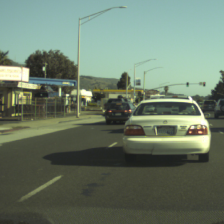

In [58]:
data.train_ds[0][0]

In [60]:
test_prediction = ssd_model.learn.predict(data.train_ds[0][0])

AttributeError: 'Learner' object has no attribute 'predict_array'

In [22]:
ssd_model.save('ssd-pascal-FL-20')

In [83]:
trn_tfms, val_tfms = tfms_from_model(resnet34, 224)
im = val_tfms(Image.open(PATH/'train/test1.jpg'))
ssd_model.learn.precompute = False
preds = ssd_model_array(im[None])
# np.argmax(preds)

NameError: name 'tfms_from_model' is not defined

## Show some results 

# Improve the result using feature pyramid